# Exploratory Data Analysis on Chicago Crimes

Group Members: Sulaiman, Shubham, Shayan, Ali

# 1. Project Overview

## 1.1 Goal
To harness the power of data to create an efficient and optimized crime-management infrastructure, enabling a proactive approach to public safety in Chicago. By leveraging advanced data analytics, we aim to transform the city's crime data into actionable insights, facilitating the development of a responsive and dynamic crime prevention and response strategy. 

## 1.2 Problem Statement
Chicago's complex crime landscape poses significant challenges for effective resource allocation and public safety enhancement. Traditional crime analysis methods may fall short in capturing the intricate patterns of criminal activity that vary across the city's diverse neighborhoods. This project proposes the use of unsupervised learning techniques, including Principal Component Analysis (PCA), clustering, and association rule mining, to delve into the Chicago Crimes dataset. Our aim is to unearth hidden crime patterns, streamline the dataset for more effective analysis, and identify non-obvious relationships between crime attributes. These novel insights are expected to bolster targeted strategies for law enforcement and community safety initiatives, employing a sophisticated, data-driven approach to augment public safety in Chicago. 

## 1.3 Business Relevance
This analysis of Chicago crimes can be useful to several sectors or beneficiaries. Law enforcement agencies can leverage these insights for predictive policing and dynamic resource allocation, enhancing their ability to preempt and respond to crime effectively. Business owners can make informed decisions based on the safety profiles of different neighborhoods. Insurance companies may adjust the rates due to neighborhood crime rates. Most importantly, families can use this analysis to select safe neighborhoods to live in Chicago. 
So the project’s findings can foster a safer living environment. By providing a foundation for data-driven decision-making, this analysis promises to significantly contribute to the safety and well-being of Chicago's communities. 

# 2. Data Overview

## 2.1 Dataset

Chicago Data Portal (https://data.cityofchicago.org/widgets/ijzp-q8t2?)

## 2.2 Data Dictionary

| Column Name           | Data Type | Description                                                                                          |
|-----------------------|-----------|------------------------------------------------------------------------------------------------------|
| ID                    | int       | Unique identifier for the record.                                                                    |
| Case Number           | string    | The Chicago Police Department RD Number (Records Division Number).                                   |
| Date                  | datetime  | Date when the incident occurred. This is sometimes a best estimate.                                 |
| Block                 | string    | The partially redacted address where the incident occurred, placed in the middle of the street block.|
| IUCR                  | string    | The Illinois Uniform Crime Reporting code. This is directly linked to the type of crime that occurred.|
| Primary Type          | string    | The primary description of the IUCR code.                                                            |
| Description           | string    | The secondary description of the IUCR code, a subcategory of the primary type.                       |
| Location Description  | string    | Description of the location where the incident occurred.                                             |
| Arrest                | bool      | Indicates whether an arrest was made.                                                                |
| Domestic              | bool      | Indicates whether the incident was domestic-related as defined by the Illinois Domestic Violence Act. |
| Beat                  | string    | Indicates the beat where the incident occurred. A beat is the smallest police geographic area.       |
| District              | int       | Indicates the police district where the incident occurred.                                           |
| Ward                  | int       | The ward (City Council district) where the incident occurred.                                        |
| Community Area        | string    | Indicates the community area where the incident occurred.                                            |
| FBI Code              | string    | Indicates the crime classification as outlined in the FBI's National Incident-Based Reporting System. |
| X Coordinate          | float     | The X coordinate of the location where the incident occurred.                                        |
| Y Coordinate          | float     | The Y coordinate of the location where the incident occurred.                                        |
| Year                  | int       | Year the incident occurred.                                                                          |
| Updated On            | datetime  | Date and time the record was last updated.                                                          |
| Latitude              | float     | The latitude of the location where the incident occurred.                                            |
| Longitude             | float     | The longitude of the location where the incident occurred.                                           |
| Location              | string    | The location where the incident occurred in a format that allows for mapping and data analysis.      |


# 3. Data Cleaning and Preparation

## 3.1 Importing Libraries

In [73]:
pip install mlxtend 

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [106]:
pip install wordcloud

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [74]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import re
import seaborn as sns
import folium
from branca.element import Template, MacroElement
from folium.plugins import FastMarkerCluster
from mlxtend.frequent_patterns import apriori, association_rules
from mlxtend.preprocessing import TransactionEncoder
from scipy.cluster.hierarchy import dendrogram, fcluster, linkage
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.manifold import TSNE
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.preprocessing import LabelEncoder, StandardScaler
import plotly.express as px
from wordcloud import WordCloud

## 3.2 Importing Dataset

In [75]:
chicago_df = pd.read_csv('Crimes_-_2001_to_Present.csv')

## 3.3 Checking & Cleaning The Data

In [76]:
chicago_df.head()
chicago_df['Primary Type'].nunique()

36

In [78]:
chicago_df.columns

Index(['ID', 'Case Number', 'Date', 'Block', 'IUCR', 'Primary Type',
       'Description', 'Location Description', 'Arrest', 'Domestic', 'Beat',
       'District', 'Ward', 'Community Area', 'FBI Code', 'X Coordinate',
       'Y Coordinate', 'Year', 'Updated On', 'Latitude', 'Longitude',
       'Location'],
      dtype='object')

In [79]:
chicago_df.shape

(7994314, 22)

In [80]:
chicago_df.isnull().sum()

ID                           0
Case Number                  0
Date                         0
Block                        0
IUCR                         0
Primary Type                 0
Description                  0
Location Description     12499
Arrest                       0
Domestic                     0
Beat                         0
District                    47
Ward                    614853
Community Area          613478
FBI Code                     0
X Coordinate             88053
Y Coordinate             88053
Year                         0
Updated On                   0
Latitude                 88053
Longitude                88053
Location                 88053
dtype: int64

In [81]:
#Changing the dtype to be datetime
chicago_df['Date'] = pd.to_datetime(chicago_df['Date'], errors='coerce')
chicago_df['Updated On'] = pd.to_datetime(chicago_df['Updated On'], errors='coerce')

#Splitting Date column to Date & Time columns
chicago_df['Crime_Date'] = chicago_df['Date'].dt.date
chicago_df['Crime_Date'] = pd.to_datetime(chicago_df['Crime_Date'], errors='coerce')
chicago_df['Crime_Time'] = chicago_df['Date'].dt.time

/scratch/4862227.1.tcn-pub/ipykernel_3184859/4147620188.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  chicago_df['Updated On'] = pd.to_datetime(chicago_df['Updated On'], errors='coerce')


In [82]:
chicago_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7994314 entries, 0 to 7994313
Data columns (total 24 columns):
 #   Column                Dtype         
---  ------                -----         
 0   ID                    int64         
 1   Case Number           object        
 2   Date                  datetime64[ns]
 3   Block                 object        
 4   IUCR                  object        
 5   Primary Type          object        
 6   Description           object        
 7   Location Description  object        
 8   Arrest                bool          
 9   Domestic              bool          
 10  Beat                  int64         
 11  District              float64       
 12  Ward                  float64       
 13  Community Area        float64       
 14  FBI Code              object        
 15  X Coordinate          float64       
 16  Y Coordinate          float64       
 17  Year                  int64         
 18  Updated On            datetime64[ns]
 19  

In [83]:
# saving the first 100 rows of the chicago_df as a csv file

df_first_100 = chicago_df.head(100)

# Save the first 100 rows to an Excel file
df_first_100.to_excel('first_100_rows.xlsx', index=False)

In [84]:
# Dropping 'Ward' and 'Community Area' columns, and then dropping rows with missing 'Latitude' or 'Longitude' values

cleaned_chicago_df = chicago_df.drop(['Ward', 'Community Area'], axis=1).dropna(subset=['Latitude', 'Longitude', 'Location', 'District', 'X Coordinate', 'Y Coordinate', 'District', 'Location Description'])
cleaned_chicago_df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,Crime_Date,Crime_Time
11,12045583,JD226426,2020-05-07 10:24:00,035XX S INDIANA AVE,0820,THEFT,$500 AND UNDER,APARTMENT,False,False,...,06,1178180.0,1881621.0,2020,2020-05-14 08:47:15,41.830482,-87.621752,"(41.830481843, -87.621751752)",2020-05-07,10:24:00
12,12031001,JD209965,2020-04-16 05:00:00,005XX W 32ND ST,0460,BATTERY,SIMPLE,APARTMENT,True,False,...,08B,1173292.0,1883705.0,2020,2020-04-23 15:45:11,41.836310,-87.639624,"(41.836310224, -87.639624112)",2020-04-16,05:00:00
13,12093529,JD282112,2020-07-01 10:16:00,081XX S COLES AVE,051A,ASSAULT,AGGRAVATED - HANDGUN,STREET,True,False,...,04A,1198234.0,1851595.0,2020,2020-07-08 15:41:45,41.747610,-87.549179,"(41.747609555, -87.549179329)",2020-07-01,10:16:00
14,12178140,JD381597,2020-09-27 23:29:00,065XX S WOLCOTT AVE,0460,BATTERY,SIMPLE,RESIDENCE - PORCH / HALLWAY,False,False,...,08B,1164812.0,1861251.0,2020,2020-10-04 15:43:55,41.774878,-87.671375,"(41.77487752, -87.671374872)",2020-09-27,23:29:00
15,4144897,HL474854,2005-07-10 15:00:00,062XX S ABERDEEN ST,0430,BATTERY,AGGRAVATED: OTHER DANG WEAPON,STREET,False,False,...,04B,1170050.0,1863524.0,2005,2018-02-28 15:56:25,41.781003,-87.652107,"(41.781002663, -87.652107119)",2005-07-10,15:00:00


In [85]:
cleaned_chicago_df['Time_Category'] = cleaned_chicago_df['Crime_Time'].apply(
    lambda x: 'Morning' if 6 <= x.hour < 12 else 
              ('Afternoon' if 12 <= x.hour < 18 else 
               ('Evening' if 18 <= x.hour < 24 else 'Night'))
)

In [86]:
cleaned_chicago_df.isnull().sum()

ID                      0
Case Number             0
Date                    0
Block                   0
IUCR                    0
Primary Type            0
Description             0
Location Description    0
Arrest                  0
Domestic                0
Beat                    0
District                0
FBI Code                0
X Coordinate            0
Y Coordinate            0
Year                    0
Updated On              0
Latitude                0
Longitude               0
Location                0
Crime_Date              0
Crime_Time              0
Time_Category           0
dtype: int64

In [87]:
cleaned_chicago_df.shape

(7898273, 23)

In [88]:
cleaned_chicago_df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,Crime_Date,Crime_Time,Time_Category
11,12045583,JD226426,2020-05-07 10:24:00,035XX S INDIANA AVE,0820,THEFT,$500 AND UNDER,APARTMENT,False,False,...,1178180.0,1881621.0,2020,2020-05-14 08:47:15,41.830482,-87.621752,"(41.830481843, -87.621751752)",2020-05-07,10:24:00,Morning
12,12031001,JD209965,2020-04-16 05:00:00,005XX W 32ND ST,0460,BATTERY,SIMPLE,APARTMENT,True,False,...,1173292.0,1883705.0,2020,2020-04-23 15:45:11,41.836310,-87.639624,"(41.836310224, -87.639624112)",2020-04-16,05:00:00,Night
13,12093529,JD282112,2020-07-01 10:16:00,081XX S COLES AVE,051A,ASSAULT,AGGRAVATED - HANDGUN,STREET,True,False,...,1198234.0,1851595.0,2020,2020-07-08 15:41:45,41.747610,-87.549179,"(41.747609555, -87.549179329)",2020-07-01,10:16:00,Morning
14,12178140,JD381597,2020-09-27 23:29:00,065XX S WOLCOTT AVE,0460,BATTERY,SIMPLE,RESIDENCE - PORCH / HALLWAY,False,False,...,1164812.0,1861251.0,2020,2020-10-04 15:43:55,41.774878,-87.671375,"(41.77487752, -87.671374872)",2020-09-27,23:29:00,Evening
15,4144897,HL474854,2005-07-10 15:00:00,062XX S ABERDEEN ST,0430,BATTERY,AGGRAVATED: OTHER DANG WEAPON,STREET,False,False,...,1170050.0,1863524.0,2005,2018-02-28 15:56:25,41.781003,-87.652107,"(41.781002663, -87.652107119)",2005-07-10,15:00:00,Afternoon


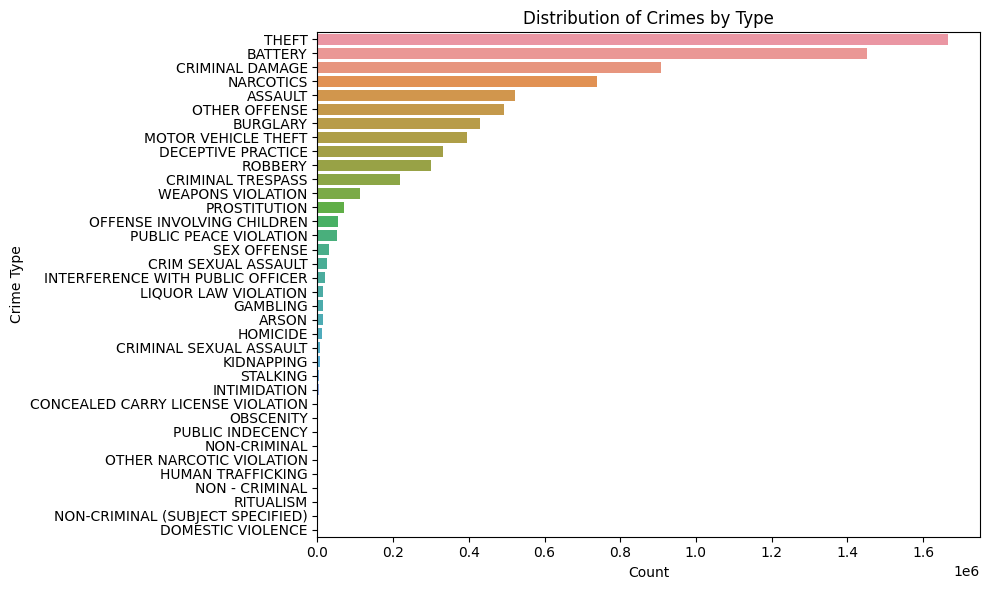

In [89]:
# plot to identify which type of crime is the most common

plt.figure(figsize=(10, 6))
sns.countplot(y='Primary Type', data=cleaned_chicago_df, order=cleaned_chicago_df['Primary Type'].value_counts().index)
plt.title('Distribution of Crimes by Type')
plt.xlabel('Count')
plt.ylabel('Crime Type')
plt.tight_layout()

Data Cleaning & Preperation done by all members: <br>
EDA Organization & Data Dictionary by Sulaiman<br>
Cleaning & coding by Shayan<br>
Visualization by Shubham<br>
Project Overview by Ali<br>

# 4. Clustering

## 4.1 Hierarchical clustering

In [115]:
time_encoder = LabelEncoder()
cleaned_chicago_df['Time_Category_Encoded'] = time_encoder.fit_transform(cleaned_chicago_df['Time_Category'])
limited_df = cleaned_chicago_df.head(100).copy()
limited_df['Primary Type Encoded'] = time_encoder.fit_transform(limited_df['Primary Type'])


X = limited_df[['Time_Category_Encoded', 'Primary Type Encoded']]

num_clusters = 3
method = 'complete'
Z = linkage(X, method)
limited_df['cluster_labels'] = fcluster(Z, num_clusters, criterion='maxclust')

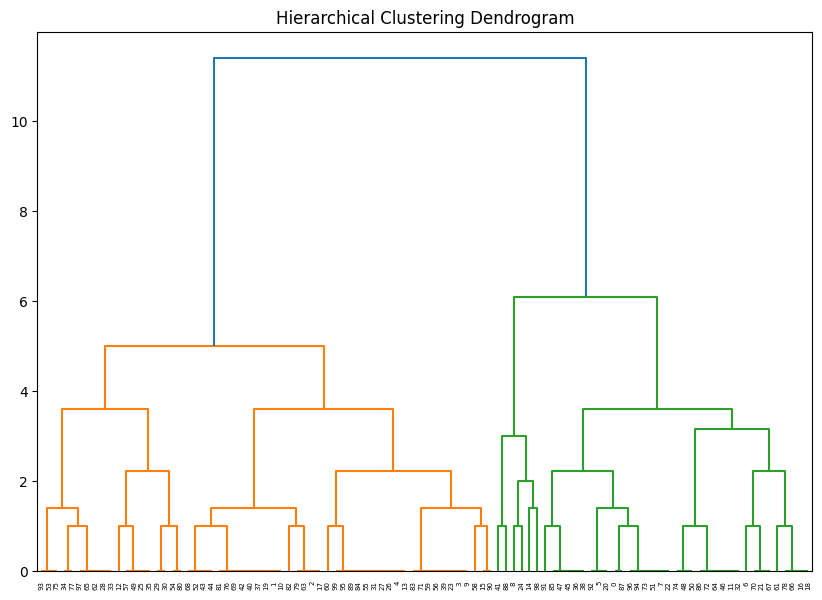

In [116]:
plt.figure(figsize=(10, 7))
plt.title('Hierarchical Clustering Dendrogram')
dn = dendrogram(Z)
plt.show()

In the analysis of Chicago crime data, hierarchical clustering was applied to identify distinct patterns based on crime types and the time of day. The process involved encoding these two variables and utilizing the 'complete' linkage method to establish hierarchical relationships. The analysis was visualized through a dendrogram, which facilitated the identification of three significant clusters by revealing a notable jump in dissimilarity after the third cluster merge. This approach effectively segmented the crime data into three distinct groups, uncovering unique patterns of criminal activity across different times, and provided insights into the temporal and categorical nature of crimes in Chicago.

Hierarchical clustering contributed by Ali

## 4.2 K-MEANS

### 4.2.1 Using Elbow Method to find the Optimal K

In [7]:
X = cleaned_chicago_df[['Latitude', 'Longitude']]

NameError: name 'cleaned_chicago_df' is not defined

/share/pkg.8/python3/3.10.12/install/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/share/pkg.8/python3/3.10.12/install/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/share/pkg.8/python3/3.10.12/install/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/share/pkg.8/python3/3.10.12/install/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureW

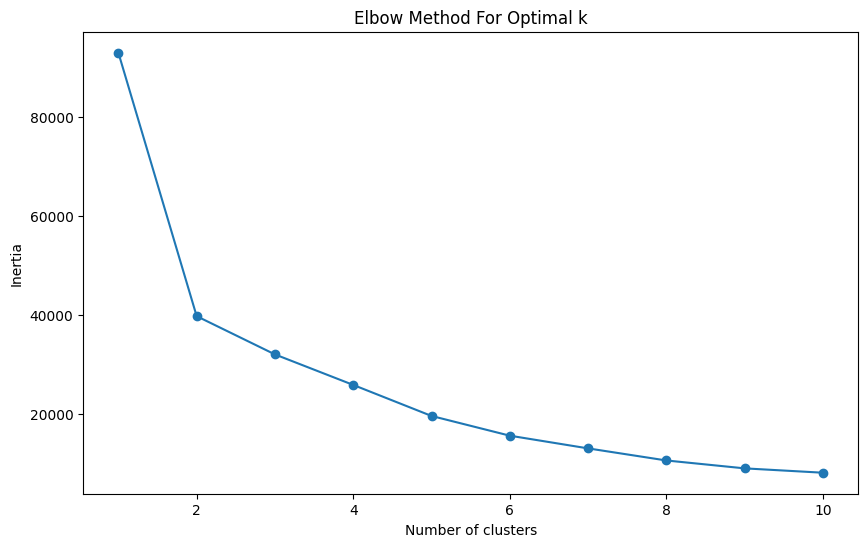

In [92]:
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

From the elbow method above, it's clear that using 2 clusters would be a good clustering choice.

### 4.2.2 Perform k-means based on the result from the elbow method

In [93]:
k = 2

kmeans = KMeans(n_clusters=k, random_state=42)
clusters = kmeans.fit_predict(X)

cleaned_chicago_df['Cluster'] = clusters

/share/pkg.8/python3/3.10.12/install/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [95]:
limited_df = cleaned_chicago_df.head(100).copy()

In [96]:
limited_df

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,Crime_Date,Crime_Time,Time_Category,Cluster
11,12045583,JD226426,2020-05-07 10:24:00,035XX S INDIANA AVE,0820,THEFT,$500 AND UNDER,APARTMENT,False,False,...,1881621.0,2020,2020-05-14 08:47:15,41.830482,-87.621752,"(41.830481843, -87.621751752)",2020-05-07,10:24:00,Morning,0
12,12031001,JD209965,2020-04-16 05:00:00,005XX W 32ND ST,0460,BATTERY,SIMPLE,APARTMENT,True,False,...,1883705.0,2020,2020-04-23 15:45:11,41.836310,-87.639624,"(41.836310224, -87.639624112)",2020-04-16,05:00:00,Night,0
13,12093529,JD282112,2020-07-01 10:16:00,081XX S COLES AVE,051A,ASSAULT,AGGRAVATED - HANDGUN,STREET,True,False,...,1851595.0,2020,2020-07-08 15:41:45,41.747610,-87.549179,"(41.747609555, -87.549179329)",2020-07-01,10:16:00,Morning,0
14,12178140,JD381597,2020-09-27 23:29:00,065XX S WOLCOTT AVE,0460,BATTERY,SIMPLE,RESIDENCE - PORCH / HALLWAY,False,False,...,1861251.0,2020,2020-10-04 15:43:55,41.774878,-87.671375,"(41.77487752, -87.671374872)",2020-09-27,23:29:00,Evening,0
15,4144897,HL474854,2005-07-10 15:00:00,062XX S ABERDEEN ST,0430,BATTERY,AGGRAVATED: OTHER DANG WEAPON,STREET,False,False,...,1863524.0,2005,2018-02-28 15:56:25,41.781003,-87.652107,"(41.781002663, -87.652107119)",2005-07-10,15:00:00,Afternoon,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253,12069994,JD254699,2020-06-05 14:15:00,011XX S TROY ST,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,True,True,...,1894990.0,2020,2020-06-12 15:41:20,41.867653,-87.704485,"(41.867652634, -87.704485374)",2020-06-05,14:15:00,Afternoon,1
254,12195675,JD402139,2020-10-16 18:00:00,016XX N WASHTENAW AVE,0890,THEFT,FROM BUILDING,HOTEL / MOTEL,False,False,...,1910819.0,2020,2020-12-17 15:40:05,41.911036,-87.694563,"(41.911036489, -87.694562787)",2020-10-16,18:00:00,Evening,1
255,12064652,JD249002,2020-05-31 19:30:00,117XX S HALSTED ST,1310,CRIMINAL DAMAGE,TO PROPERTY,PARKING LOT / GARAGE (NON RESIDENTIAL),False,False,...,1827146.0,2020,2020-06-07 15:41:45,41.681110,-87.642018,"(41.681109736, -87.642018411)",2020-05-31,19:30:00,Evening,0
256,12102405,JD292702,2020-07-09 14:58:00,002XX E 47TH ST,0930,MOTOR VEHICLE THEFT,THEFT / RECOVERY - AUTOMOBILE,STREET,False,False,...,1873911.0,2020,2020-07-16 15:42:49,41.809317,-87.620757,"(41.80931735, -87.620757235)",2020-07-09,14:58:00,Afternoon,0


### 4.2.3 Perform k-means Clustering on the limited df

In [97]:
kmeans = KMeans(n_clusters=2, random_state=42)
limited_df['Cluster'] = kmeans.fit_predict(limited_df[['Latitude', 'Longitude']])


/share/pkg.8/python3/3.10.12/install/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


### 4.2.3 Visualize the Clusters on the Map

In [98]:
map_center = [limited_df['Latitude'].mean(), limited_df['Longitude'].mean()]

chicago_map = folium.Map(location=map_center, zoom_start=12)

colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']

for _, row in limited_df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=5,
        color=colors[int(row['Cluster']) % len(colors)],
        fill=True,
        fill_color=colors[int(row['Cluster']) % len(colors)],
        fill_opacity=0.7,
        popup=f"Crime Type: {row['Primary Type']}"
    ).add_to(chicago_map)

# Generate the legend HTML
legend_html = '<div style="position: fixed; bottom: 50px; left: 50px; width: 150px; height: {}px; background-color: white; border:2px solid grey; z-index: 9999; font-size: 14px; padding: 5px;"><b>Legend</b><br>'.format(25 * len(colors))
for i, color in enumerate(colors):
    legend_html += f'<i style="background: {color}; width: 10px; height: 10px; margin-right: 5px; display: inline-block;"></i> Cluster {i}<br>'
legend_html += '</div>'

# Add the legend to the map
legend = MacroElement()
legend._template = Template(legend_html)
chicago_map.get_root().add_child(legend)

# Save the map to an HTML file
chicago_map.save('updated_1_chicago_crime_clusters_with_legend.html')

In [99]:
cluster_centers = kmeans.cluster_centers_
chicago_map = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

chicago_map.add_child(FastMarkerCluster(cleaned_chicago_df[['Latitude', 'Longitude']].values.tolist()))

for i, center in enumerate(cluster_centers):
    folium.CircleMarker(
        location=[center[1], center[0]],
        radius=10,
        color=colors[i % len(colors)],
        fill=True,
        fill_color=colors[i % len(colors)],
        fill_opacity=0.7,
        popup=f"Cluster Center: {i}"
    ).add_to(chicago_map)

# Save the map to an HTML file
chicago_map.save('chicago_crime_clusters_centers.html')

Trying the above map with fast marker cluster with the whole Dataset (cleaned_chicago_df) created a very large file that cannot be opened on the browser, so we need to reduce the df

### 4.2.4 Visualize the Clusters on the Map with reduced df (60%)

In [100]:
sixtypercent_df = cleaned_chicago_df.sample(frac=0.6, random_state=42)

In [101]:
sixtypercent_df.shape

(4738964, 24)

By reducing the df to 60%, we end up with 4,738,964 crimes

In [102]:
cluster_centers = kmeans.cluster_centers_

chicago_map = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

chicago_map.add_child(FastMarkerCluster(sixtypercent_df[['Latitude', 'Longitude']].values.tolist()))

for i, center in enumerate(cluster_centers):
    folium.CircleMarker(
        location=[center[1], center[0]], # Assuming [latitude, longitude] order
        radius=10,
        color=colors[i % len(colors)],
        fill=True,
        fill_color=colors[i % len(colors)],
        fill_opacity=0.7,
        popup=f"Cluster Center: {i}"
    ).add_to(chicago_map)

# Save the map to an HTML file
chicago_map.save('fraction_of_chicago_crime_clusters_centers.html')

K-means done by Shubham & Sulaiman

# 5. TF-IDF

# 5.1 Implementing TF-IDF for this dataset

In [103]:
# Preprocessing
cleaned_chicago_df['Text'] = cleaned_chicago_df['Primary Type'] + ' ' + cleaned_chicago_df['Description']
cleaned_chicago_df['Text'] = cleaned_chicago_df['Text'].str.lower()

# TF-IDF Transformation
tfidf_vectorizer = TfidfVectorizer()
X_tfidf = tfidf_vectorizer.fit_transform(cleaned_chicago_df['Text'])

# Analysis
le = LabelEncoder()
y = le.fit_transform(cleaned_chicago_df['Primary Type'])
y = (y == le.transform(['HOMICIDE'])[0]).astype(int)  # 1 for 'HOMICIDE', 0 for everything else

X_train, X_test, y_train, y_test = train_test_split(X_tfidf, y, test_size=0.4, random_state=42, stratify=y)

nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

y_pred = nb_classifier.predict(X_test)

print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

0.9999939860285949
              precision    recall  f1-score   support

           0       1.00      1.00      1.00   3154088
           1       1.00      1.00      1.00      5222

    accuracy                           1.00   3159310
   macro avg       1.00      1.00      1.00   3159310
weighted avg       1.00      1.00      1.00   3159310



From the above result by using the TF-IDF technique on Chicago crime data, we trained a model to spot 'HOMICIDE' instances. It reached almost 100% accuracy, which, while impressive, may hint at overfitting or data inconsistencies that need further investigation.

In [104]:
cv = CountVectorizer()

X = cv.fit_transform(cleaned_chicago_df['Description'])

word_counts = X.toarray().sum(axis=0)

feature_names = cv.get_feature_names_out()

word_count_dict = dict(zip(feature_names, word_counts))

top_15_words = sorted(word_count_dict.items(), key=lambda x: x[1], reverse=True)[:15]
for word, count in top_15_words:
    print(f'{word}: {count}')

simple: 1555084
to: 1097427
500: 1066008
under: 674249
domestic: 672272
battery: 672178
and: 659656
poss: 611600
over: 513139
vehicle: 496875
property: 452119
theft: 426624
entry: 422006
aggravated: 421114
automobile: 358309


Utilizing text analysis, we applied a CountVectorizer to extract word frequencies. From this, we identified the top 15 most frequent words, which included common terms like 'simple', 'domestic', and 'battery'.

In [105]:
tfidf_model = TfidfVectorizer(norm=None)

tfidf_model.fit(cleaned_chicago_df['Description'])

df_tfidf_transformed = tfidf_model.transform(cleaned_chicago_df['Description'])
tfidf_vectors = pd.DataFrame(df_tfidf_transformed.toarray(), columns=tfidf_model.get_feature_names_out())
tfidf_vectors

,10,10gm,18,30,300,30gms,500,abandonment,abduction,abuse,...,way,weap,weapon,weapons,while,white,wireroom,with,writer,zone
0,0.0,0.0,0.0,0.0,0.0,0.0,3.002722,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,4.383513,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7898268,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7898269,0.0,0.0,0.0,0.0,0.0,0.0,3.002722,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7898270,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7898271,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [107]:
num_unique_primary_types = cleaned_chicago_df['Primary Type'].nunique()
num_unique_primary_types

36

From the above code, we can say that we have 36 unique crime type.

## 5.2 Creating a Word Cloud for each Crime Types

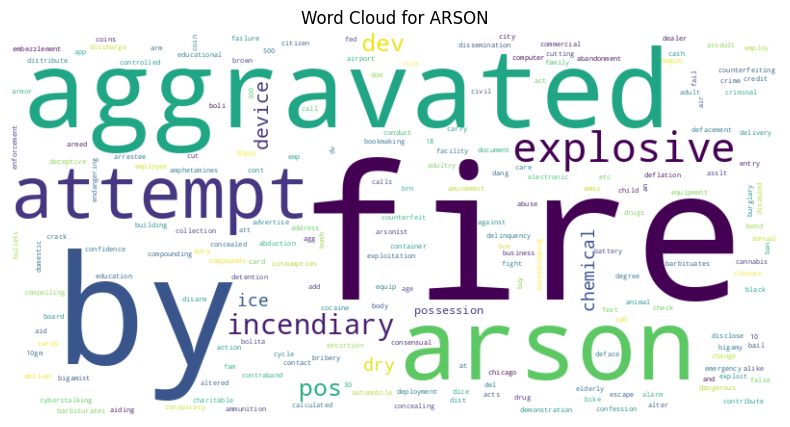

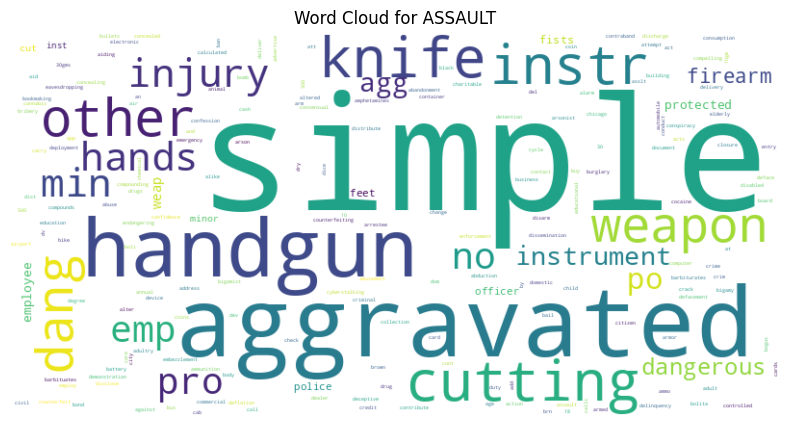

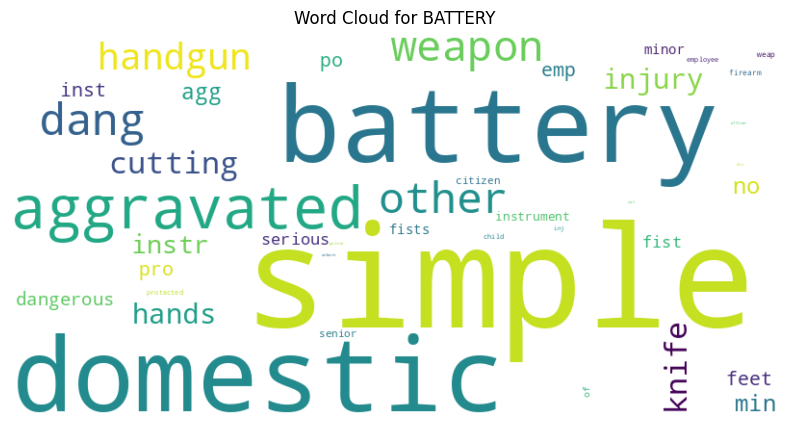

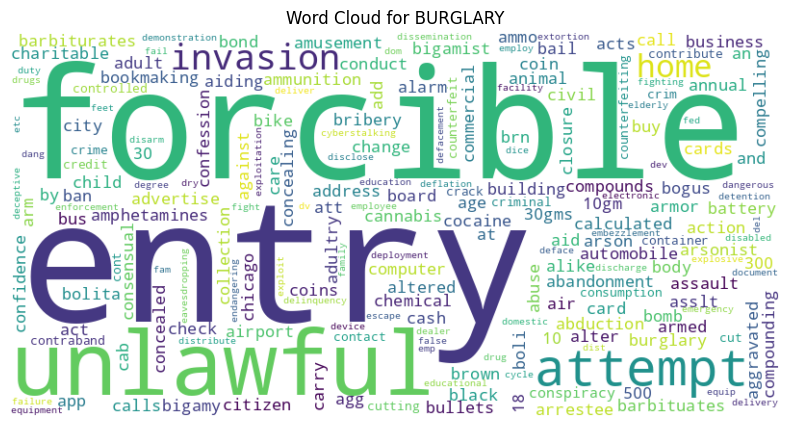

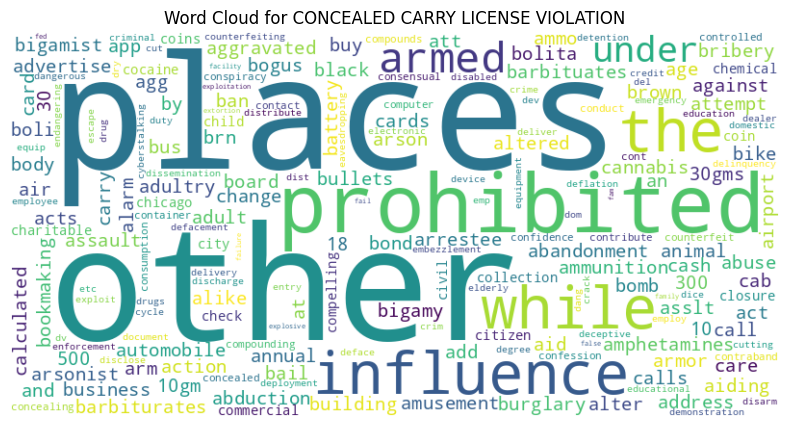

...

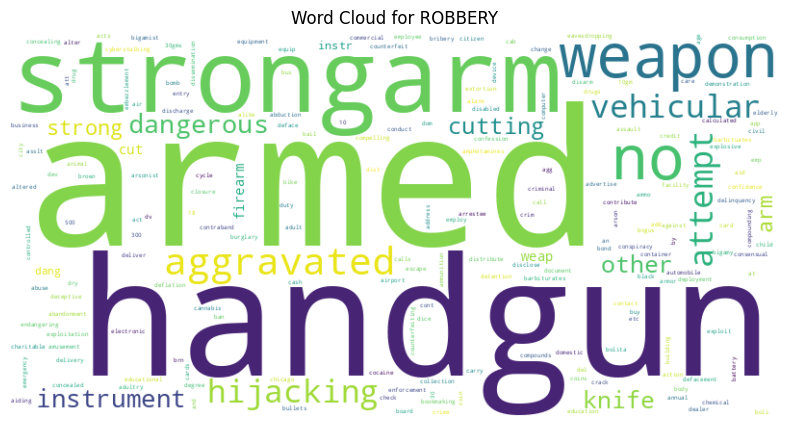

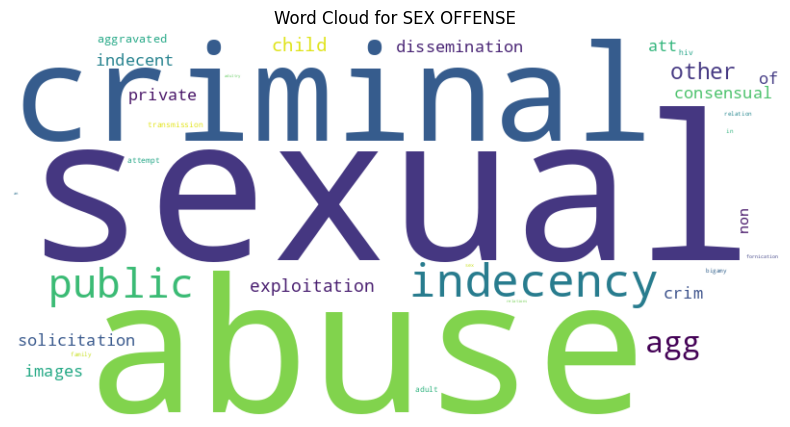

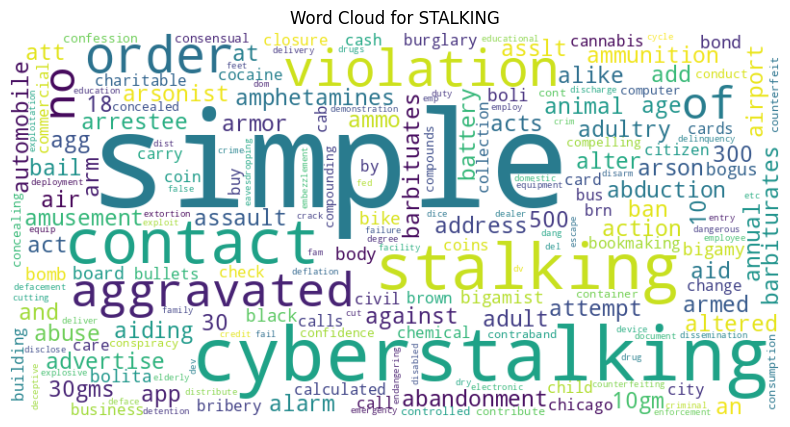

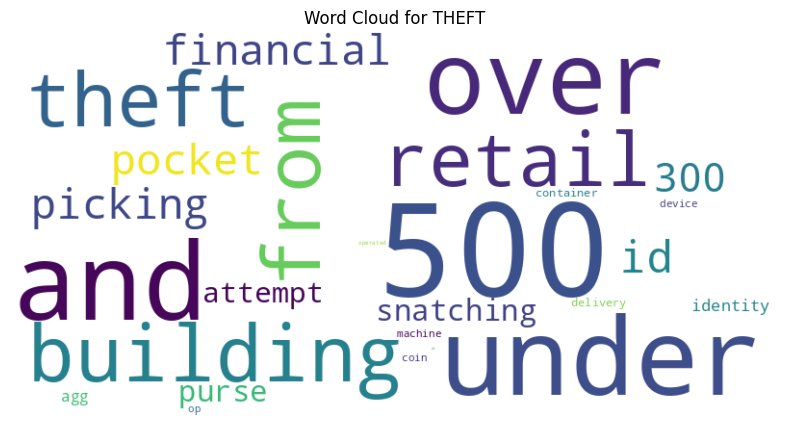

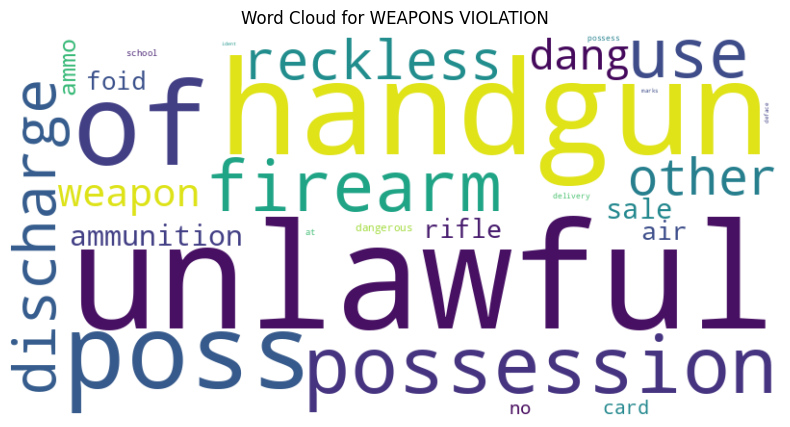

In [108]:
tfidf_vectorizer = TfidfVectorizer()

X_tfidf = tfidf_vectorizer.fit_transform(cleaned_chicago_df['Description'])

le = LabelEncoder()

y_encoded = le.fit_transform(cleaned_chicago_df['Primary Type'])

model = MultinomialNB()

model.fit(X_tfidf, y_encoded)

feature_names = tfidf_vectorizer.get_feature_names_out()

output_directory = '/projectnb/ba820/students/shayanhk/'

for i, crime_type in enumerate(le.classes_):
    log_prob = model.feature_log_prob_[i]
    
    word_probs = np.exp(log_prob)
    
    word_probs_dict = dict(zip(feature_names, word_probs))
    
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_probs_dict)
    
    # Saving the word cloud as PNG
    output_path = f"{output_directory}{crime_type.replace('/', '_')}_wordcloud.png"
    wordcloud.to_file(output_path)
    
    # Display the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {crime_type}')
    plt.show()

From the above result, we've created a word cloud for each crime type

TF-IDF done by Shubham & Sulaiman

# 6. Association Rule Mining

In [117]:
cleaned_chicago_df.shape

(7898273, 27)

In [118]:
cleaned_chicago_df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Latitude,Longitude,Location,Crime_Date,Crime_Time,Time_Category,Cluster,Text,Processed_Description,Time_Category_Encoded
11,12045583,JD226426,2020-05-07 10:24:00,035XX S INDIANA AVE,0820,THEFT,$500 AND UNDER,APARTMENT,False,False,...,41.830482,-87.621752,"(41.830481843, -87.621751752)",2020-05-07,10:24:00,Morning,0,theft $500 and under,500 and under,2
12,12031001,JD209965,2020-04-16 05:00:00,005XX W 32ND ST,0460,BATTERY,SIMPLE,APARTMENT,True,False,...,41.836310,-87.639624,"(41.836310224, -87.639624112)",2020-04-16,05:00:00,Night,0,battery simple,simple,3
13,12093529,JD282112,2020-07-01 10:16:00,081XX S COLES AVE,051A,ASSAULT,AGGRAVATED - HANDGUN,STREET,True,False,...,41.747610,-87.549179,"(41.747609555, -87.549179329)",2020-07-01,10:16:00,Morning,0,assault aggravated - handgun,aggravated handgun,2
14,12178140,JD381597,2020-09-27 23:29:00,065XX S WOLCOTT AVE,0460,BATTERY,SIMPLE,RESIDENCE - PORCH / HALLWAY,False,False,...,41.774878,-87.671375,"(41.77487752, -87.671374872)",2020-09-27,23:29:00,Evening,0,battery simple,simple,1
15,4144897,HL474854,2005-07-10 15:00:00,062XX S ABERDEEN ST,0430,BATTERY,AGGRAVATED: OTHER DANG WEAPON,STREET,False,False,...,41.781003,-87.652107,"(41.781002663, -87.652107119)",2005-07-10,15:00:00,Afternoon,0,battery aggravated: other dang weapon,aggravated other dang weapon,0


In [119]:
df_2024 = cleaned_chicago_df[cleaned_chicago_df['Year'] == 2024]
df_2024

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Latitude,Longitude,Location,Crime_Date,Crime_Time,Time_Category,Cluster,Text,Processed_Description,Time_Category_Encoded
157567,13360393,JH142536,2024-01-11 00:00:00,008XX S MICHIGAN AVE,1365,CRIMINAL TRESPASS,TO RESIDENCE,APARTMENT,False,False,...,41.871504,-87.624161,"(41.871504164, -87.624160788)",2024-01-11,00:00:00,Night,1,criminal trespass to residence,to residence,3
157587,13360477,JH142313,2024-01-08 10:44:00,053XX N MILWAUKEE AVE,1110,DECEPTIVE PRACTICE,BOGUS CHECK,OTHER (SPECIFY),False,False,...,41.976903,-87.768867,"(41.976902894, -87.768866564)",2024-01-08,10:44:00,Morning,1,deceptive practice bogus check,bogus check,2
157588,13360476,JH142346,2024-01-11 12:00:00,059XX W IRVING PARK RD,1153,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT OVER $ 300,BANK,False,False,...,41.953066,-87.776128,"(41.953066476, -87.776128044)",2024-01-11,12:00:00,Afternoon,1,deceptive practice financial identity theft ov...,financial identity theft over 300,0
157589,13360524,JH142718,2024-01-25 00:00:00,048XX S ELIZABETH ST,0440,BATTERY,"AGGRAVATED - HANDS, FISTS, FEET, NO / MINOR IN...",APARTMENT,False,False,...,41.806141,-87.656396,"(41.806140974, -87.656396363)",2024-01-25,00:00:00,Night,0,"battery aggravated - hands, fists, feet, no / ...",aggravated hands fists feet no minor injury,3
157590,13360515,JH142772,2024-01-25 11:49:00,069XX N KEDZIE AVE,0890,THEFT,FROM BUILDING,APARTMENT,False,False,...,42.007143,-87.709280,"(42.007142825, -87.709280128)",2024-01-25,11:49:00,Morning,1,theft from building,from building,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211548,13356212,JH136760,2024-02-01 19:36:00,019XX N HUMBOLDT BLVD,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,False,True,...,41.916544,-87.702062,"(41.91654447, -87.702061981)",2024-02-01,19:36:00,Evening,1,battery domestic battery simple,domestic battery simple,1
211549,13355986,JH136241,2024-02-01 12:30:00,035XX W ADAMS ST,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,False,True,...,41.878287,-87.714185,"(41.87828717, -87.714185338)",2024-02-01,12:30:00,Afternoon,1,battery domestic battery simple,domestic battery simple,0
211550,13355707,JH136906,2024-02-01 22:58:00,005XX N RIDGEWAY AVE,2024,NARCOTICS,POSSESS - HEROIN (WHITE),ALLEY,True,False,...,41.890464,-87.719834,"(41.890463519, -87.719833886)",2024-02-01,22:58:00,Evening,1,narcotics possess - heroin (white),possess heroin white,1
211552,13355396,JH136298,2024-02-01 13:35:00,073XX S UNION AVE,0430,BATTERY,AGGRAVATED - OTHER DANGEROUS WEAPON,APARTMENT,False,False,...,41.760960,-87.641866,"(41.760960264, -87.641865746)",2024-02-01,13:35:00,Afternoon,0,battery aggravated - other dangerous weapon,aggravated other dangerous weapon,0


In [120]:
df_2024['Primary Type'].nunique()

27

In [121]:
selected_data = df_2024[['Primary Type', 'Location Description']]
transactions = selected_data.groupby('Location Description')['Primary Type'].apply(list).reset_index(name='Primary Types')
transactions = transactions['Primary Types'].tolist()

transactions

[['CRIMINAL TRESPASS',
  'LIQUOR LAW VIOLATION',
  'NARCOTICS',
  'CRIMINAL TRESPASS'],
 ['THEFT', 'BATTERY', 'DECEPTIVE PRACTICE', 'THEFT'],
 ['DECEPTIVE PRACTICE',
  'OTHER OFFENSE',
  'CRIMINAL DAMAGE',
  'DECEPTIVE PRACTICE',
  'DECEPTIVE PRACTICE',
  'BATTERY',
  'DECEPTIVE PRACTICE',
  'OTHER OFFENSE'],
 ['THEFT',
  'MOTOR VEHICLE THEFT',
  'THEFT',
  'CONCEALED CARRY LICENSE VIOLATION',
  'ASSAULT',
  'THEFT'],
 ['ASSAULT',
  'BATTERY',
  'OTHER OFFENSE',
  'BATTERY',
  'DECEPTIVE PRACTICE',
  'BATTERY',
  'ASSAULT',
  'CRIMINAL TRESPASS',
  'DECEPTIVE PRACTICE'],
 ['THEFT'],
 ['THEFT',
  'MOTOR VEHICLE THEFT',
  'MOTOR VEHICLE THEFT',
  'MOTOR VEHICLE THEFT',
  'THEFT',
  'DECEPTIVE PRACTICE',
  'CRIMINAL DAMAGE',
  'CRIMINAL DAMAGE',
  'DECEPTIVE PRACTICE',
  'THEFT',
  'THEFT',
  'MOTOR VEHICLE THEFT',
  'MOTOR VEHICLE THEFT',
  'MOTOR VEHICLE THEFT',
  'THEFT',
  'CRIMINAL DAMAGE',
  'MOTOR VEHICLE THEFT',
  'DECEPTIVE PRACTICE',
  'CRIMINAL DAMAGE',
  'THEFT',
  'CRIMINAL D

In [122]:
te = TransactionEncoder()
te_ary = te.fit(transactions).transform(transactions)
df = pd.DataFrame(te_ary, columns=te.columns_)

df

,ARSON,ASSAULT,BATTERY,BURGLARY,CONCEALED CARRY LICENSE VIOLATION,CRIMINAL DAMAGE,CRIMINAL SEXUAL ASSAULT,CRIMINAL TRESPASS,DECEPTIVE PRACTICE,HOMICIDE,...,OBSCENITY,OFFENSE INVOLVING CHILDREN,OTHER OFFENSE,PROSTITUTION,PUBLIC PEACE VIOLATION,ROBBERY,SEX OFFENSE,STALKING,THEFT,WEAPONS VIOLATION
0,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,True,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,True,False
2,False,False,True,False,False,True,False,False,True,False,...,False,False,True,False,False,False,False,False,False,False
3,False,True,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
4,False,True,True,False,False,False,False,True,True,False,...,False,False,True,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
96,False,False,True,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
97,False,False,True,False,False,False,False,False,True,False,...,False,False,False,False,False,False,True,False,True,False
98,True,True,True,True,False,True,True,True,True,False,...,False,False,True,False,False,True,False,False,True,True


We took the 2024 crime data and grouped the types of crimes happening at each place. Then, I converted that into a table where each crime type is a column. Looking at it, we can see which crimes often occur together at the same spots.

# 6.1 Finding interesting Associations

In [123]:
frequent_itemsets = apriori(df, min_support=0.15, use_colnames=True)
frequent_itemsets

,support,itemsets
0,0.64,(ASSAULT)
1,0.67,(BATTERY)
2,0.37,(BURGLARY)
3,0.59,(CRIMINAL DAMAGE)
4,0.19,(CRIMINAL SEXUAL ASSAULT)
...,...,...
2390,0.15,"(BATTERY, ASSAULT, DECEPTIVE PRACTICE, OTHER O..."
2391,0.17,"(BATTERY, ASSAULT, DECEPTIVE PRACTICE, OTHER O..."
2392,0.15,"(ASSAULT, DECEPTIVE PRACTICE, OTHER OFFENSE, T..."
2393,0.15,"(BATTERY, DECEPTIVE PRACTICE, OTHER OFFENSE, T..."


Using the apriori algorithm, we analyzed the 2024 crime data for frequent patterns. setting the minimum support to 0.15 to find the common crime combinations.<br>
For example, battery and assault often occurs together. These insights can aid in understanding crime trends and preventing future incidents.

In [124]:
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=0.05)
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(BATTERY),(ASSAULT),0.67,0.64,0.52,0.776119,1.212687,0.0912,1.608000,0.531469
1,(ASSAULT),(BATTERY),0.64,0.67,0.52,0.812500,1.212687,0.0912,1.760000,0.487179
2,(BURGLARY),(ASSAULT),0.37,0.64,0.32,0.864865,1.351351,0.0832,2.664000,0.412698
3,(ASSAULT),(BURGLARY),0.64,0.37,0.32,0.500000,1.351351,0.0832,1.260000,0.722222
4,(CRIMINAL DAMAGE),(ASSAULT),0.59,0.64,0.51,0.864407,1.350636,0.1324,2.655000,0.633190
...,...,...,...,...,...,...,...,...,...,...
121007,(BURGLARY),"(BATTERY, ASSAULT, DECEPTIVE PRACTICE, OTHER O...",0.37,0.17,0.15,0.405405,2.384738,0.0871,1.395909,0.921693
121008,(ROBBERY),"(BATTERY, ASSAULT, DECEPTIVE PRACTICE, OTHER O...",0.37,0.16,0.15,0.405405,2.533784,0.0908,1.412727,0.960847
121009,(CRIMINAL DAMAGE),"(BATTERY, ASSAULT, DECEPTIVE PRACTICE, OTHER O...",0.59,0.15,0.15,0.254237,1.694915,0.0615,1.139773,1.000000
121010,(CRIMINAL TRESPASS),"(BATTERY, ASSAULT, DECEPTIVE PRACTICE, OTHER O...",0.45,0.15,0.15,0.333333,2.222222,0.0825,1.275000,1.000000


The data indicates a 77% confidence in the co-occurrence of battery and assault crimes. Additionally, the presence of burglary also suggests a high likelihood of assault, pointing to common crime patterns.

## 6.2 Top 5 Associations

In [125]:
top_5 = rules.sort_values(by='confidence', ascending=False).head(10)

top_5

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
36034,"(NARCOTICS, CRIMINAL TRESPASS, MOTOR VEHICLE T...","(BATTERY, THEFT)",0.16,0.61,0.16,1.0,1.639344,0.0624,inf,0.464286
113587,"(ASSAULT, OTHER OFFENSE, BURGLARY, CRIMINAL TR...","(BATTERY, CRIMINAL DAMAGE, THEFT, DECEPTIVE PR...",0.16,0.36,0.16,1.0,2.777778,0.1024,inf,0.761905
47178,"(BATTERY, OTHER OFFENSE, BURGLARY, CRIMINAL TR...",(CRIMINAL DAMAGE),0.16,0.59,0.16,1.0,1.694915,0.0656,inf,0.488095
89381,"(BATTERY, DECEPTIVE PRACTICE, OTHER OFFENSE, W...",(THEFT),0.15,0.75,0.15,1.0,1.333333,0.0375,inf,0.294118
113602,"(DECEPTIVE PRACTICE, OTHER OFFENSE, BURGLARY, ...","(BATTERY, CRIMINAL DAMAGE, ASSAULT, THEFT)",0.16,0.45,0.16,1.0,2.222222,0.0880,inf,0.654762
47134,"(WEAPONS VIOLATION, CRIMINAL DAMAGE, CRIMINAL ...","(BATTERY, DECEPTIVE PRACTICE)",0.15,0.44,0.15,1.0,2.272727,0.0840,inf,0.658824
11368,"(CRIMINAL TRESPASS, ASSAULT, DECEPTIVE PRACTIC...",(BATTERY),0.27,0.67,0.27,1.0,1.492537,0.0891,inf,0.452055
47127,"(BATTERY, WEAPONS VIOLATION, CRIMINAL TRESPASS...","(CRIMINAL DAMAGE, DECEPTIVE PRACTICE)",0.15,0.41,0.15,1.0,2.439024,0.0885,inf,0.694118
47119,"(DECEPTIVE PRACTICE, WEAPONS VIOLATION, BURGLA...",(BATTERY),0.15,0.67,0.15,1.0,1.492537,0.0495,inf,0.388235
47118,"(BATTERY, WEAPONS VIOLATION, BURGLARY, CRIMINA...",(DECEPTIVE PRACTICE),0.15,0.53,0.15,1.0,1.886792,0.0705,inf,0.552941


We sorted crime association rules by confidence, selecting the top five. The results revealed strong links between crimes like battery and theft. This suggests when one occurs, the other is likely, helping police focus on these patterns for better prevention strategies.

Association Rule Mining contributed by Shayan